# Mask R-CNN Demo

A quick intro to using the pre-trained model to detect and segment objects.

In [1]:
import os
import sys
import scipy
import random
import math
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt
import datetime
import tensorflow as tf


import cv2
%matplotlib inline

# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize


from samples.board import board

# Import COCO config
#sys.path.append(os.path.join(ROOT_DIR, "samples/balloon/"))  # To find local version
BOARD_DIR = os.path.join(ROOT_DIR, "datasets/board")

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
BOARD_WEIGHTS_PATH = os.path.join(ROOT_DIR, "mask_rcnn_board_0009.h5")

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "images")

# ROS packages
import rospy
import geometry_msgs.msg
import time
import roslib; roslib.load_manifest('ur_driver')
import actionlib
from std_msgs.msg import String
# ROS Image message
from sensor_msgs.msg import Image
from thin_obj_bin_picking.msg import carton_pose
# ROS Image message -> OpenCV2 image converter
from cv_bridge import CvBridge, CvBridgeError
#import tf

Using TensorFlow backend.


## Configurations

We'll be using a model trained on the MS-COCO dataset. The configurations of this model are in the ```CocoConfig``` class in ```coco.py```.

For inferencing, modify the configurations a bit to fit the task. To do so, sub-class the ```CocoConfig``` class and override the attributes you need to change.

In [2]:
config = board.BoardConfig()
BOARD_DIR = os.path.join(ROOT_DIR, "datasets/board")

# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Create Model and Load Trained Weights

In [3]:
# Create model in inference mode
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)



In [4]:
# Load weights trained on MS-COCO
model.load_weights(BOARD_WEIGHTS_PATH, by_name=True)

In [5]:
# Load validation dataset
dataset = board.BoardDataset()
dataset.load_board(BOARD_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 15
Classes: ['BG', 'b']


## Class Names

The model classifies objects and returns class IDs, which are integer value that identify each class. Some datasets assign integer values to their classes and some don't. For example, in the MS-COCO dataset, the 'person' class is 1 and 'teddy bear' is 88. The IDs are often sequential, but not always. The COCO dataset, for example, has classes associated with class IDs 70 and 72, but not 71.

To improve consistency, and to support training on data from multiple sources at the same time, our ```Dataset``` class assigns it's own sequential integer IDs to each class. For example, if you load the COCO dataset using our ```Dataset``` class, the 'person' class would get class ID = 1 (just like COCO) and the 'teddy bear' class is 78 (different from COCO). Keep that in mind when mapping class IDs to class names.

To get the list of class names, you'd load the dataset and then use the ```class_names``` property like this.
```
# Load COCO dataset
dataset = coco.CocoDataset()
dataset.load_coco(COCO_DIR, "train")
dataset.prepare()

# Print class names
print(dataset.class_names)
```

We don't want to require you to download the COCO dataset just to run this demo, so we're including the list of class names below. The index of the class name in the list represent its ID (first class is 0, second is 1, third is 2, ...etc.)

In [6]:
class_names = dataset.class_names

## Run Object Detection

In [7]:
# Rank the mask areas, output the maximum area
def max_area(area):
    area_max = 0
    index = 0
    for i, a in enumerate(area):
        if(a > area_max):
            area_max = a
            index = i
    return area_max, index

In [8]:
# Select the maximum area mask, output the mask and its corners
def mask_rank(img, mask):
    mask_int = mask.astype(np.uint8)
    area = np.zeros([mask_int.shape[2]], dtype=np.int)
    boxx = np.zeros([4, 2, mask_int.shape[2]], dtype = np.float)
    img_copy = img.copy()
    for i in range(mask_int.shape[2]):        
        mask_copy = mask_int[:,:,i].copy()
#         plt.imshow(mask_copy)
#         plt.show()
        area[i] = mask_copy.sum()
        print(area[i])
    
    mmax, index = max_area(area)
    im2,contours,hierarchy = cv2.findContours(mask_int[:,:,index].copy(), 1, 2)
    cnt = contours[0]     
    for j in range(len(contours)):
        if(len(contours[j]) > len(cnt)):
            cnt = contours[j]
    hull = cv2.convexHull(cnt,returnPoints = True)
    rect = cv2.minAreaRect(hull)
    box = cv2.boxPoints(rect)
    box = np.int0(box)
    cv2.drawContours(img_copy,[box],0,(0,0,255),2)
    plt.imshow(img_copy)
    plt.show()
    print(box)
    return mask_int[:,:,index].copy(), box

In [9]:
# Compute position of mask center and rotation of mask
def get_mask_pose(max_boxx):
    position = (max_boxx[0] + max_boxx[2]) / 2
    # Counterclockwise is positive direction
    if(np.linalg.norm(max_boxx[0]-max_boxx[1]) > np.linalg.norm(max_boxx[1]-max_boxx[2])):
        rotation = math.atan2((max_boxx[2]-max_boxx[1])[1], (max_boxx[2]-max_boxx[1])[0])
        print("rotation 111")
    else:
        rotation = math.atan2((max_boxx[1]-max_boxx[0])[1], (max_boxx[1]-max_boxx[0])[0])
        print("rotation 222")
    pose={
        'x':position[0],
        'y':position[1],
        'rz':rotation
    }
    return pose

In [10]:
is_detect = 0
img_index = 0
def img_index_callback(data):
    global img_index
    global is_detect
    
    print(data.data)
    img_index = data.data
    is_detect = 1


In [11]:
rospy.init_node('img_segmentation')
rospy.Subscriber('/carton_img_index', String, img_index_callback)

functions for carton pose detection

In [12]:
def get_max_area_mask(masks):
    #get the number of masks
    mask_num = masks.shape[2]
    
    largest_mask_idx = 0
    largest_mask_area = 0
    for index in range(mask_num):        
        mask = r['masks'][:,:,index]
        
        #get the area of masks[index]
        temp_mask_pixel_sum = 0
        for row in mask:
            temp_mask_pixel_sum += sum(row)
        
        #compare the result with the 
        if (temp_mask_pixel_sum > largest_mask_area):
            largest_mask_area = temp_mask_pixel_sum
            largest_mask_idx = index
    
    return largest_mask_idx



In [13]:
direct_i = [-1,  0, 1, 0]
direct_j = [ 0, -1, 0, 1]
    

def set_father(i, j, new_father_id, father):
    original_father = father[i][j]
    father[i][j] = new_father_id
    shape=father.shape
    
    for k in range(4):
        if (i+direct_i[k] < shape[0]) and (i+direct_i[k] >= 0) and (j+direct_j[k] < shape[1]) and (j+direct_j[k] >= 0) and (father[i+direct_i[k]][j+direct_j[k]] == original_father):
            set_father(i+direct_i[k], j+direct_j[k], new_father_id, father)

    
def get_largest_region(mask):
    
    shape = mask.shape
    father = np.zeros(shape, dtype=np.uint8)    
    
    father_maximum = 0
    
    for i in range(shape[0]):
        for j in range(shape[1]):
            if (mask[i][j] != 0):

                new_father_flag = 1
                for k in range(4):
                    if (i+direct_i[k] < shape[0]) and (i+direct_i[k] >= 0) and (j+direct_j[k] < shape[1]) and (j+direct_j[k] >= 0) and mask[i+direct_i[k]][j+direct_j[k]] != 0 and father[i+direct_i[k]][j+direct_j[k]] != 0:
                        new_father_flag = 0
                        if father[i][j] == 0:
                            father[i][j] = father[i+direct_i[k]][j+direct_j[k]]
                        elif father[i][j] != father[i+direct_i[k]][j+direct_j[k]]:
                            set_father(i, j, father[i+direct_i[k]][j+direct_j[k]], father)
                if new_father_flag == 1:
                    father_maximum += 1
                    father[i][j] = father_maximum
    area = np.zeros(father_maximum+1)
    for i in range(shape[0]):
        for j in range(shape[1]):
            if (mask[i][j] != 0):
                area[father[i][j]] += 1

    indexs = np.where(area == np.amax(area))
    max_area_idx = indexs[0][0]
    
    for i in range(shape[0]):
        for j in range(shape[1]):
            if (father[i][j] != max_area_idx):
                mask[i][j] = 0
    return mask

# mask = np.zeros((5, 5), dtype=np.uint8)

# mask[0][0] = 255
# mask[1][1] = 255
# mask[1][2] = 255
# mask[2][1] = 255
# mask[2][2] = 255
# mask[3][2] = 255

# mask[1][4] = 255
# mask[2][4] = 255

# mask[3][3] = 255
# mask[3][4] = 255

# mask[4][0] = 255
# mask[0][1] = 255

# print(mask)
# mask = get_largest_region(mask)
# print(mask)

In [14]:
import scipy
import cv2
import numpy as np
from matplotlib import pyplot as plt
import scipy.io as sio

def get_board_pose(image, r):

    index = get_max_area_mask(r['masks'])              
    print("The largest area img is :", index)
    
    mask = r['masks'];
    mask1 = mask[:, :, index] * 255;
    mask1 = np.uint8(mask1)
    #print((mask1.max()))    
    
    #make the mask larger for robustness
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(20, 20))
    mask1 = cv2.erode(mask1, kernel)
    
    
    #Erode and then dilate the image to eliminate the noise
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(30, 30))
#     mask_eroded = cv2.erode(mask1, kernel)
#     mask_dilated = cv2.dilate(mask_eroded, kernel)

#     mask_dilated = cv2.dilate(mask1, kernel)
#     mask_eroded = cv2.erode(mask_dilated, kernel)
    
    #get the center of the carton
    ret,thresh = cv2.threshold(mask1,127,255,0)
    im2,contours,hierarchy = cv2.findContours(thresh, 1, 2)
    cnt = contours[0]

    M_carton = cv2.moments(cnt)
    cx_carton = int(M_carton['m10']/M_carton['m00'])
    cy_carton = int(M_carton['m01']/M_carton['m00'])
    
#     #filter the gree bar

# #     lower_green = np.array([0,80,0])
# #     upper_green = np.array([45,255,255])
    
#     lower_green = np.array([0,80,0])
#     upper_green = np.array([75,255,255])
    
#     green_mask = cv2.inRange(image, lower_green, upper_green)
#     res = cv2.bitwise_and(image,image, mask= green_mask)
    
#     plt.figure(figsize=(8,8),dpi=80)
#     plt.imshow(res)
#     plt.title('green filter')
    
#     mask_green_carton = cv2.bitwise_and(mask_dilated, green_mask)
    
    
#     mask_green_carton_processed = mask_green_carton

#     #Erode and then dilate the image to eliminate the noise
#     kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(2, 2))
#     mask_eroded = cv2.erode(mask_green_carton, kernel)
#     mask_green_carton_processed = cv2.dilate(mask_eroded, kernel)
    
#     #dilate and then erode the image to fill the words
#     kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(9, 9))
#     mask_dilated = cv2.dilate(mask_green_carton_processed, kernel)
#     mask_green_carton_processed = cv2.erode(mask_dilated, kernel)
    
#     print('green_max', np.amax(mask_green_carton_processed))
#     print('shape', mask_green_carton_processed.shape)
#     print('dtype', mask_green_carton_processed.dtype.name)
    
    
#     mask_green_carton = get_largest_region(mask_green_carton_processed)
    
    
    
    
#     plt.figure(figsize=(8,8),dpi=80)
#     plt.imshow(mask_green_carton_processed)
#     plt.title('mask_green_carton_processed')
    
#     _, contours,hierarchy = cv2.findContours(mask_green_carton_processed,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
#     cnt = contours[0]

#     #calculate center point
#     M = cv2.moments(cnt)
#     cx = int(M['m10']/M['m00'])
#     cy = int(M['m01']/M['m00'])
    
#     #draw bounding point
#     rect = cv2.minAreaRect(cnt)
#     box = cv2.boxPoints(rect)
#     box = np.int0(box)
#     img_result = cv2.drawContours(image.copy(),[box],0,(0,0,255),8)

#     #draw center point
#     cv2.circle(img_result, (cx_carton, cy_carton), 8, (255, 0, 255), 8)
    
#     center_points = [[0, 0], [0, 0], [0, 0], [0, 0]]
#     center_dist = [[0, 0], [0, 1], [0, 2], [0, 3]]
#     for i in range(4):
#         center_points[i][0] = (box[i][0] + box[(i+1)%4][0]) / 2 
#         center_points[i][1] = (box[i][1] + box[(i+1)%4][1]) / 2 
#         center_dist[i][0] = math.sqrt((center_points[i][0] - cx)**2 + (center_points[i][1] - cy)**2)

#     #get farest two centers
#     for i in range(4):
#         for j in range(i+1, 4):
#             if (center_dist[i][0] < center_dist[j][0]):
#                 tmp = center_dist[i][0]
#                 center_dist[i][0] = center_dist[j][0]
#                 center_dist[j][0] = tmp

#                 tmp = center_dist[i][1]
#                 center_dist[i][1] = center_dist[j][1]
#                 center_dist[j][1] = tmp

#     far_point1_x = int(center_points[center_dist[0][1]][0])
#     far_point1_y = int(center_points[center_dist[0][1]][1])

#     far_point2_x = int(center_points[center_dist[1][1]][0])
#     far_point2_y = int(center_points[center_dist[1][1]][1])
    
#     dist1 = math.sqrt((far_point1_x - cx_carton)**2 + (far_point1_y - cy_carton)**2)
#     dist2 = math.sqrt((far_point2_x - cx_carton)**2 + (far_point2_y - cy_carton)**2)

#     #update cx and cy real value
#     cx = int((far_point1_x + far_point2_x) / 2)
#     cy = int((far_point1_y + far_point2_y) / 2)
#     cv2.circle(img_result, (cx, cy), 8, (255, 0, 0), 8)

#     if dist1 < dist2:
#         tilt_point_x = int(far_point1_x + (far_point1_x - cx) * (104.0 / 81.5)) #104/81.3
#         tilt_point_y = int(far_point1_y + (far_point1_y - cy) * (104.0 / 81.5)) #104/81.3

#         fixed_point_x = far_point2_x
#         fixed_point_y = far_point2_y
#     else:
#         tilt_point_x = int(far_point2_x + (far_point2_x - cx) * (104.0 / 81.5))
#         tilt_point_y = int(far_point2_y + (far_point2_y - cy) * (104.0 / 81.5))

#         fixed_point_x = far_point1_x
#         fixed_point_y = far_point1_y

#     cv2.circle(img_result, (tilt_point_x, tilt_point_y), 8, (255, 255, 0), 8)
#     cv2.circle(img_result, (fixed_point_x, fixed_point_y), 8, (0, 255, 0), 8)
    
#     plt.figure(figsize=(8,8),dpi=80)
#     plt.imshow(img_result)
#     plt.title('img_result')

#     #calculate angle
#     dy = - (fixed_point_y - tilt_point_y)
#     dx = fixed_point_x - tilt_point_x
    
#     print('dy = '+str(dy)+' dx='+str(dx) )
    
#     plt.show()
    pose={
        'Hong_x':tilt_point_x,
        'Hong_y':tilt_point_y,
        'Kong_x':fixed_point_x,
        'Kong_y':fixed_point_y,
        'rz':math.atan2(dy, dx)
    }
    return pose


    

In [15]:
sys.setrecursionlimit(500000)

0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


/home/qxuaj/anaconda3/envs/tf_gpu/lib/python3.6/site-packages/ipykernel_launcher.py:21: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.


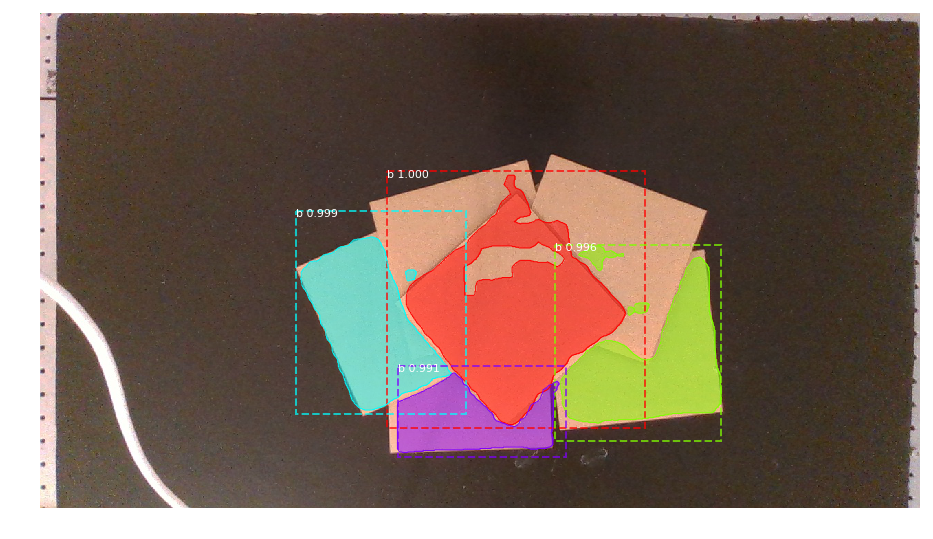

52899
29445
30030
16691


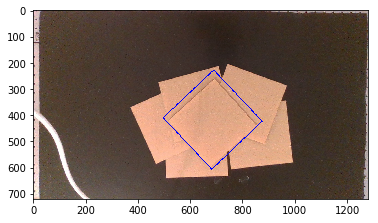

[[683 606]
 [497 410]
 [690 228]
 [875 423]]


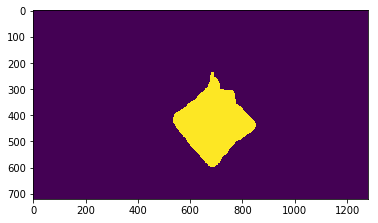

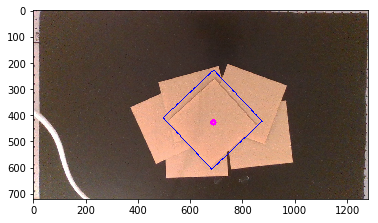

689 428
[193, 182]
43.31980559507259
output angle =  -43.31980559507259
center_x = 689 , center_y =  428
carton_pose_msg is  header: 
  seq: 31
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.0331191
Hong_y: 0.0459612
Kong_x: 0.0
Kong_y: 0.0
angle: -0.756073238957878
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


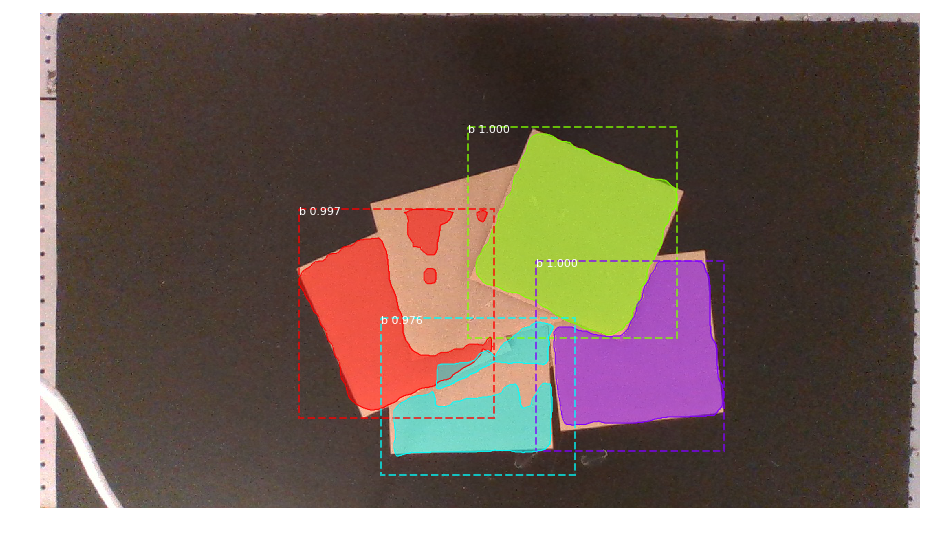

53976
40197
33273
23619


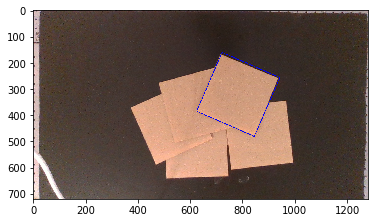

[[845 481]
 [625 385]
 [722 161]
 [943 257]]


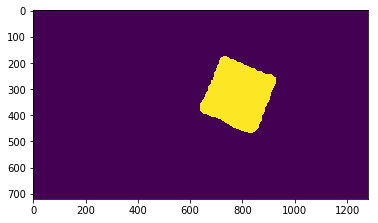

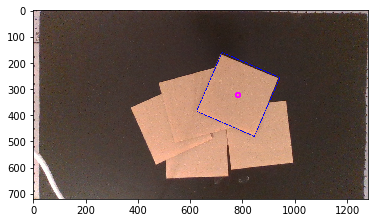

783 323
[97, 224]
66.58566523618974
output angle =  23.41433476381025
center_x = 783 , center_y =  323
carton_pose_msg is  header: 
  seq: 32
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.0966537
Hong_y: -0.0250083
Kong_x: 0.0
Kong_y: 0.0
angle: 0.4086572337926577
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


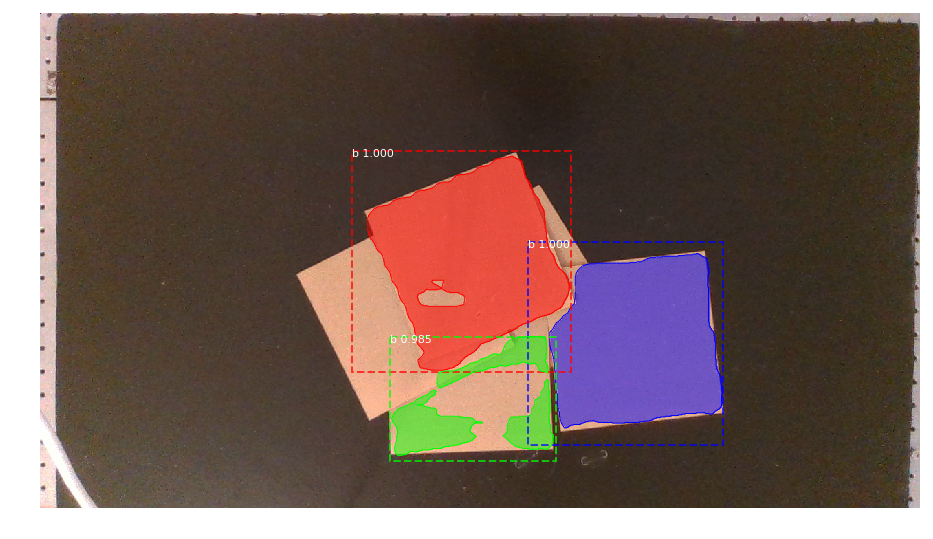

51370
55227
14276


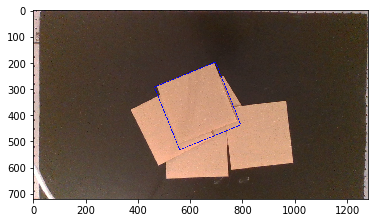

[[560 532]
 [463 293]
 [697 198]
 [794 437]]


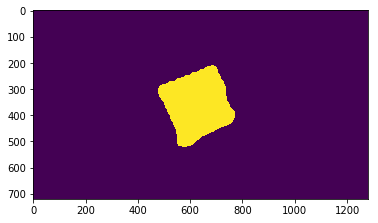

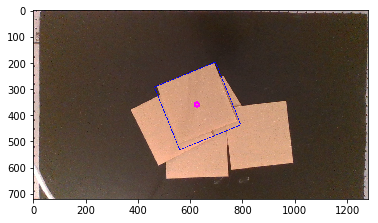

626 360
[234, 95]
22.096311629660402
output angle =  -22.096311629660402
center_x = 626 , center_y =  360
carton_pose_msg is  header: 
  seq: 33
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.009462599999999998
Hong_y: 0.0
Kong_x: 0.0
Kong_y: 0.0
angle: -0.38565339048428793
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


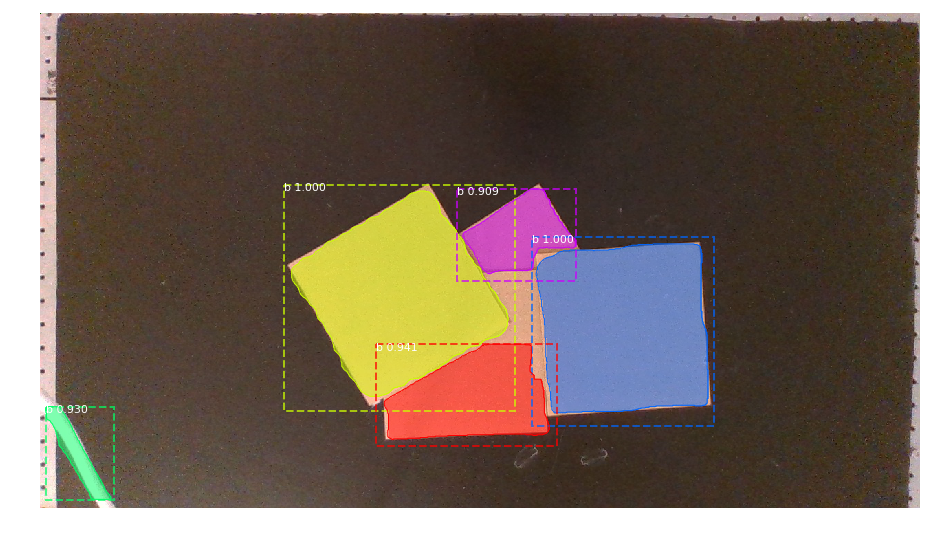

55542
54699
24038
3743
11443


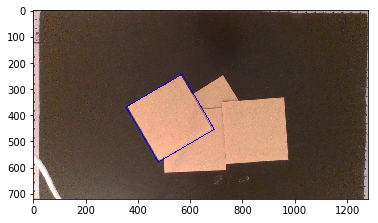

[[478 579]
 [355 369]
 [570 244]
 [692 454]]


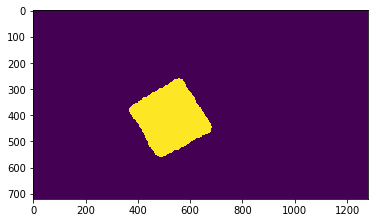

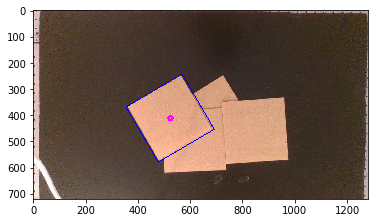

525 411
[215, 125]
30.173520029644333
output angle =  -30.173520029644333
center_x = 525 , center_y =  411
carton_pose_msg is  header: 
  seq: 34
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.07772849999999999
Hong_y: 0.0344709
Kong_x: 0.0
Kong_y: 0.0
angle: -0.5266272714337507
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


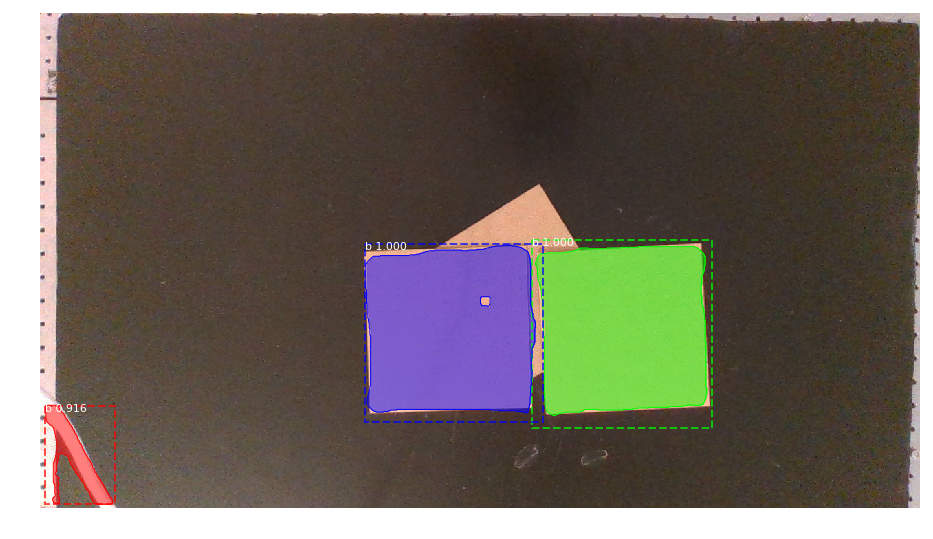

55111
54739
4646


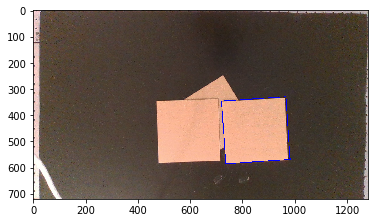

[[736 585]
 [720 346]
 [966 330]
 [982 569]]


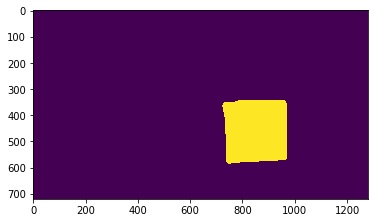

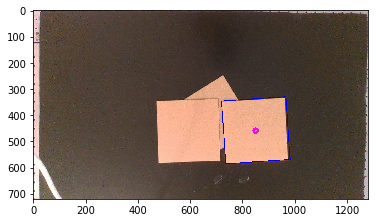

850 459
[246, 16]
3.7213132647497598
output angle =  -3.7213132647497598
center_x = 850 , center_y =  459
carton_pose_msg is  header: 
  seq: 35
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.141939
Hong_y: 0.06691409999999999
Kong_x: 0.0
Kong_y: 0.0
angle: -0.06494916896802275
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


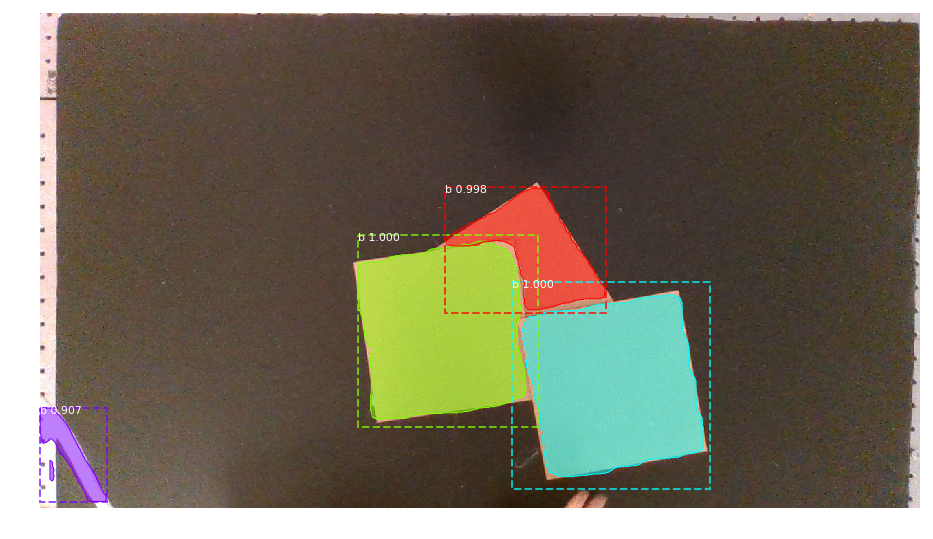

52581
54746
18022
4452


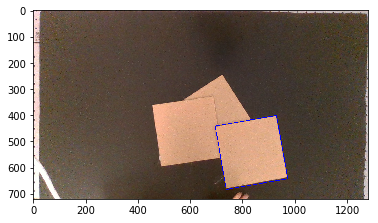

[[738 683]
 [696 442]
 [930 401]
 [973 642]]


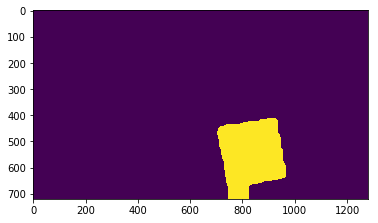

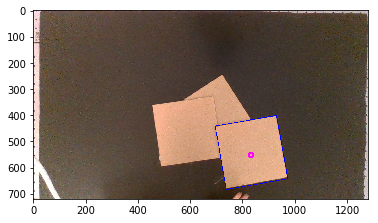

832 552
[234, 41]
9.93812397222488
output angle =  -9.93812397222488
center_x = 832 , center_y =  552
carton_pose_msg is  header: 
  seq: 36
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.1297728
Hong_y: 0.1297728
Kong_x: 0.0
Kong_y: 0.0
angle: -0.17345298478670165
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  150.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


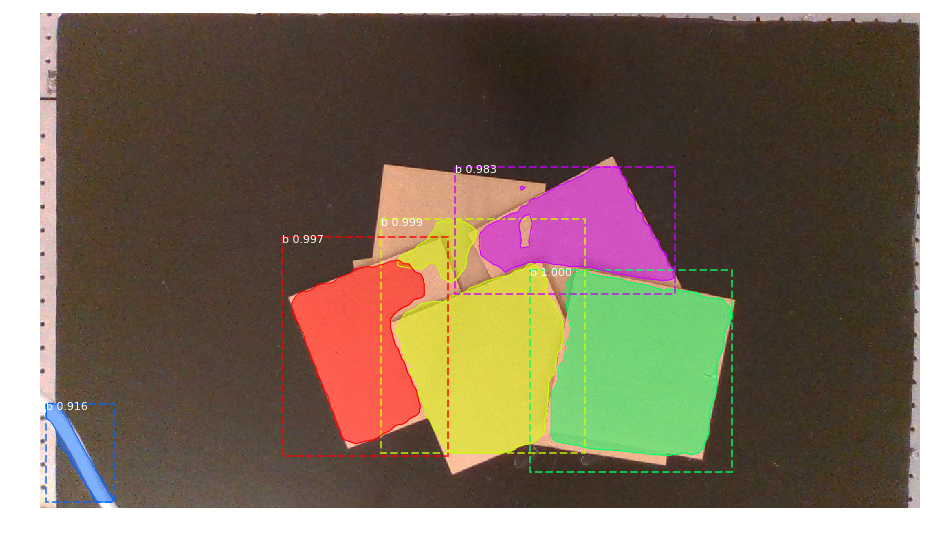

55471
53049
32877
27314
3917


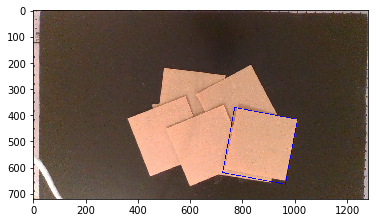

[[ 964  663]
 [ 724  619]
 [ 770  371]
 [1010  416]]


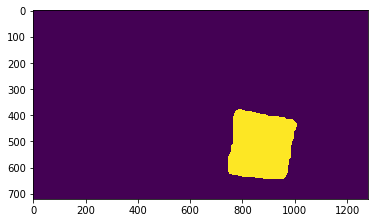

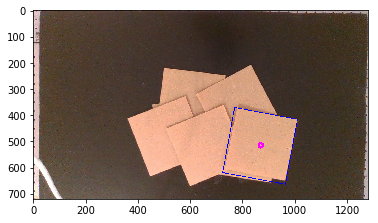

870 515
[46, 248]
79.49197785976759
output angle =  10.50802214023241
center_x = 870 , center_y =  515
carton_pose_msg is  header: 
  seq: 37
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.15545699999999998
Hong_y: 0.1047645
Kong_x: 0.0
Kong_y: 0.0
angle: 0.18339958421951685
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


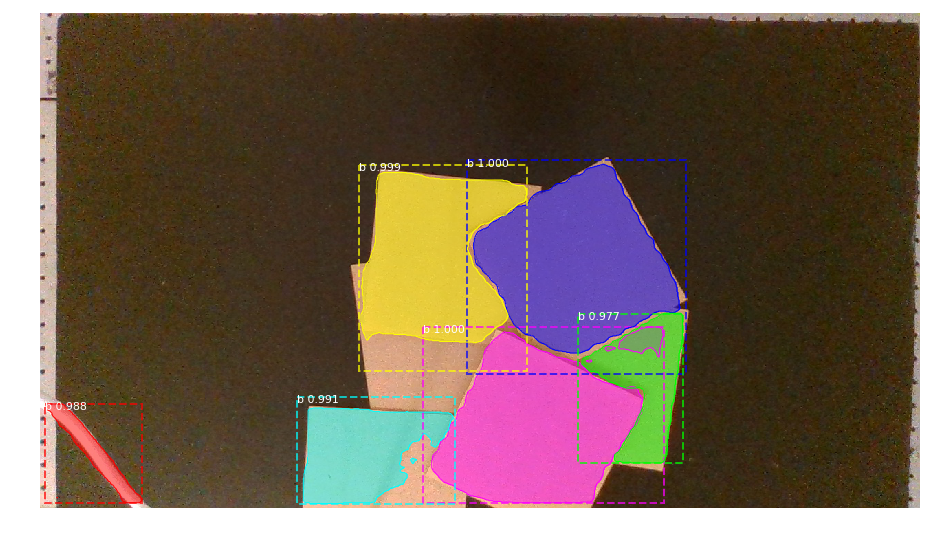

52131
51855
42464
21208
4293
16401


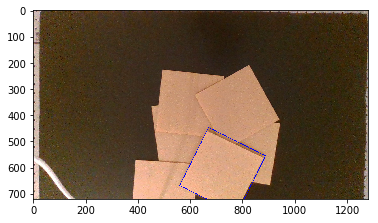

[[778 777]
 [560 668]
 [670 447]
 [888 555]]


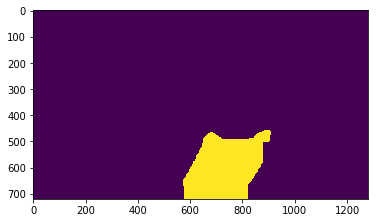

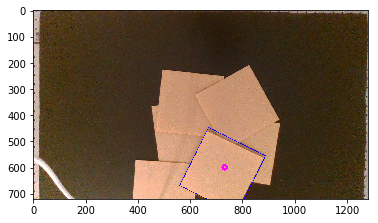

732 599
[110, 221]
63.53874541138948
output angle =  26.46125458861053
center_x = 732 , center_y =  599
carton_pose_msg is  header: 
  seq: 38
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.062182799999999996
Hong_y: 0.1615401
Kong_x: 0.0
Kong_y: 0.0
angle: 0.4618360167797113
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


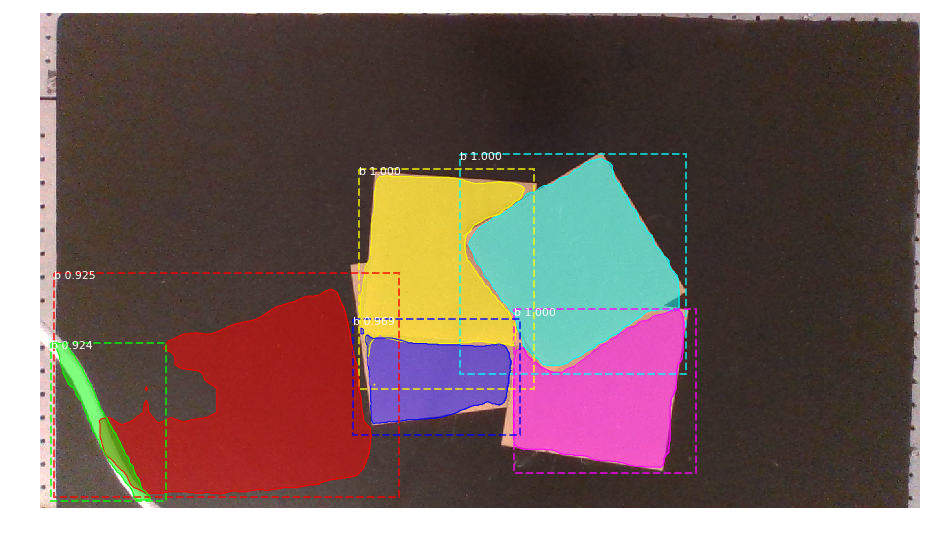

55013
38818
43537
21009
73807
5986


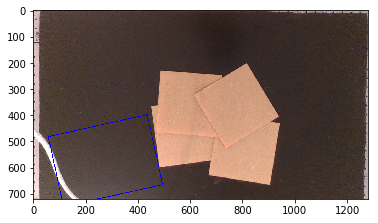

[[116 748]
 [ 58 482]
 [436 398]
 [495 665]]


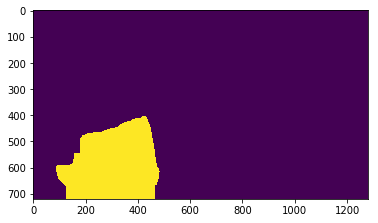

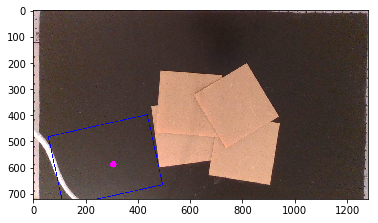

307 588
[378, 84]
12.528807709151511
output angle =  -12.528807709151511
center_x = 307 , center_y =  588
carton_pose_msg is  header: 
  seq: 39
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.2250747
Hong_y: 0.1541052
Kong_x: 0.0
Kong_y: 0.0
angle: -0.21866894587394195
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


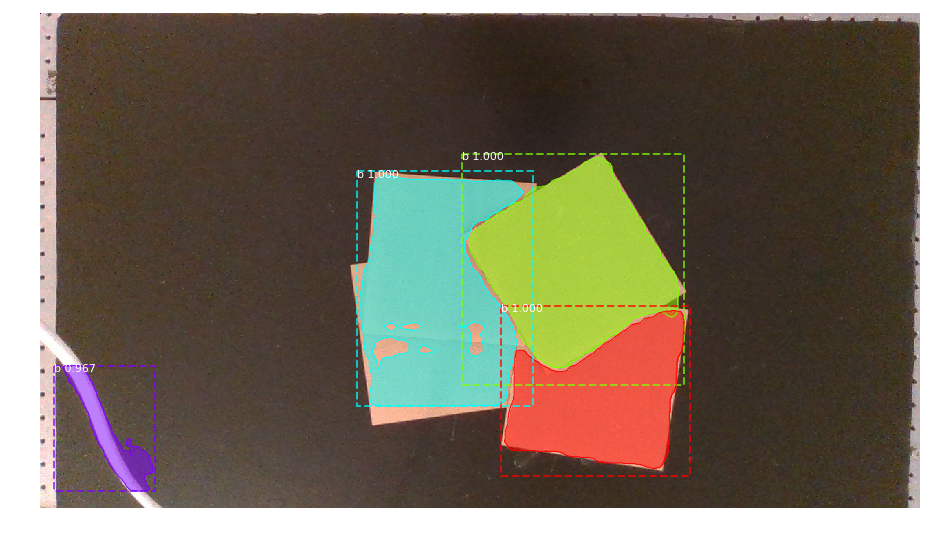

55487
39619
58973
6501


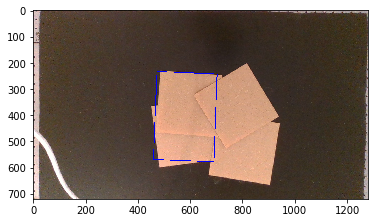

[[691 578]
 [460 569]
 [473 234]
 [703 243]]


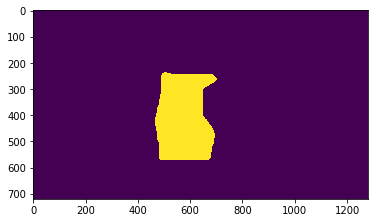

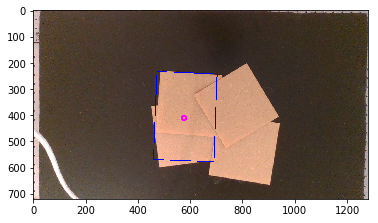

576 411
[13, 335]
87.7776967675289
output angle =  2.2223032324711043
center_x = 576 , center_y =  411
carton_pose_msg is  header: 
  seq: 40
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.0432576
Hong_y: 0.0344709
Kong_x: 0.0
Kong_y: 0.0
angle: 0.03878650838433373
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


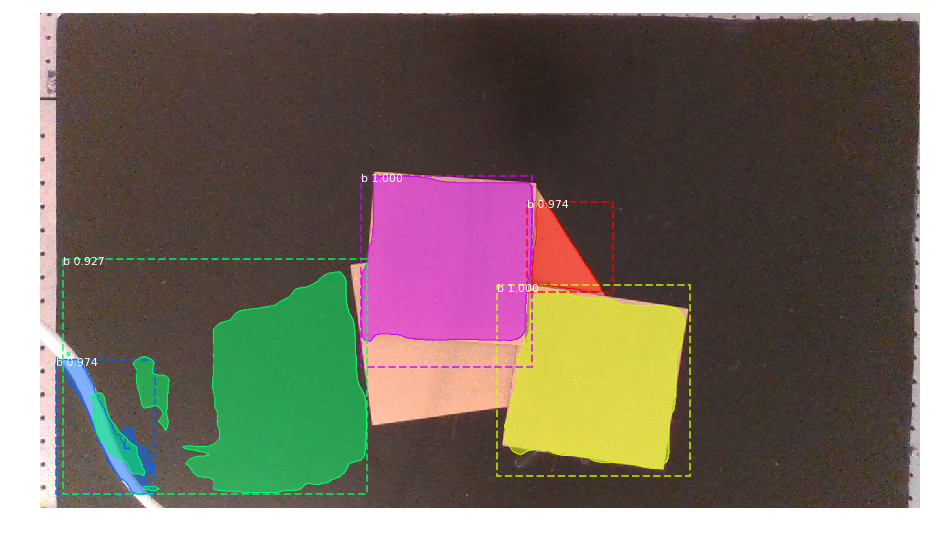

53111
54334
7509
7073
65102


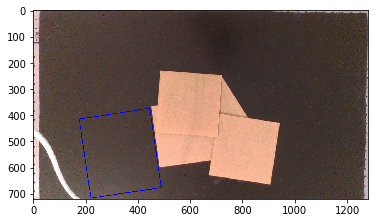

[[221 716]
 [176 415]
 [445 374]
 [490 676]]


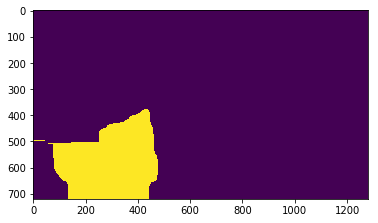

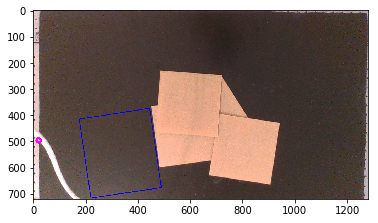

21 496
[269, 41]
8.666117917433532
output angle =  -8.666117917433532
center_x = 21 , center_y =  496
carton_pose_msg is  header: 
  seq: 41
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.4183821
Hong_y: 0.0919224
Kong_x: 0.0
Kong_y: 0.0
angle: -0.15125229102528923
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


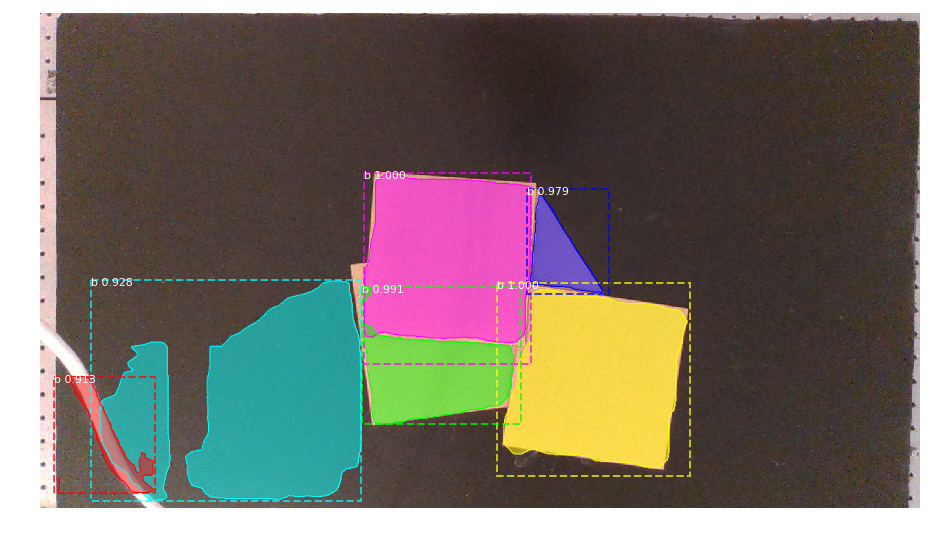

53303
53159
22578
7383
77232
5597


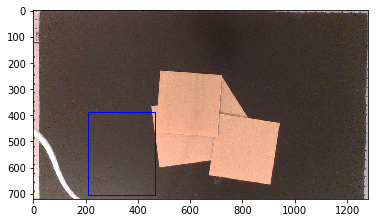

[[213 707]
 [213 390]
 [467 390]
 [467 707]]


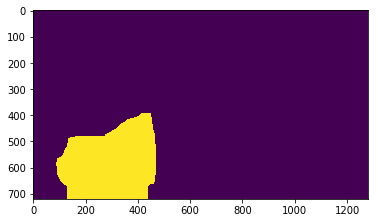

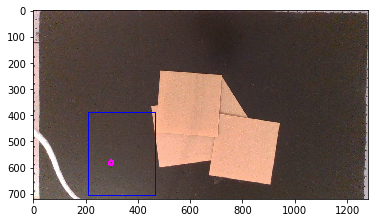

298 581
[254, 0]
0.0
output angle =  -0.0
center_x = 298 , center_y =  581
carton_pose_msg is  header: 
  seq: 42
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.2311578
Hong_y: 0.1493739
Kong_x: 0.0
Kong_y: 0.0
angle: -0.0
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


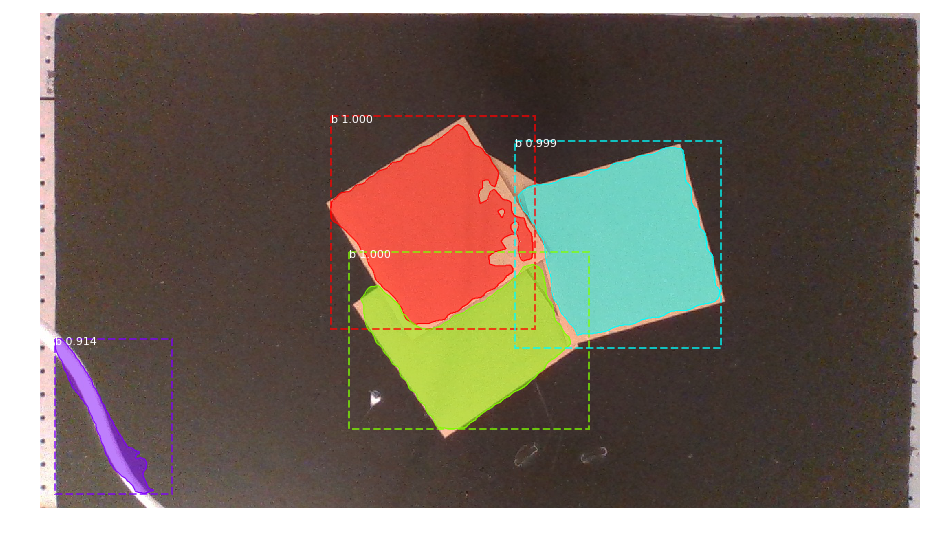

47943
37592
52955
6760


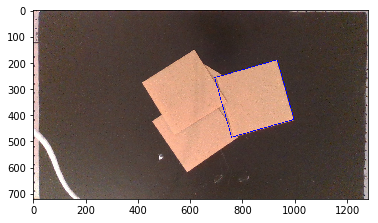

[[758 484]
 [694 257]
 [933 189]
 [997 416]]


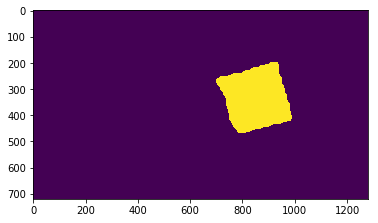

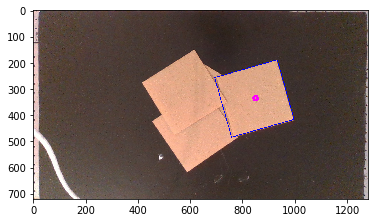

850 335
[239, 68]
15.882050675750254
output angle =  -15.882050675750254
center_x = 850 , center_y =  335
carton_pose_msg is  header: 
  seq: 43
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.141939
Hong_y: -0.0168975
Kong_x: 0.0
Kong_y: 0.0
angle: -0.27719407626043224
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


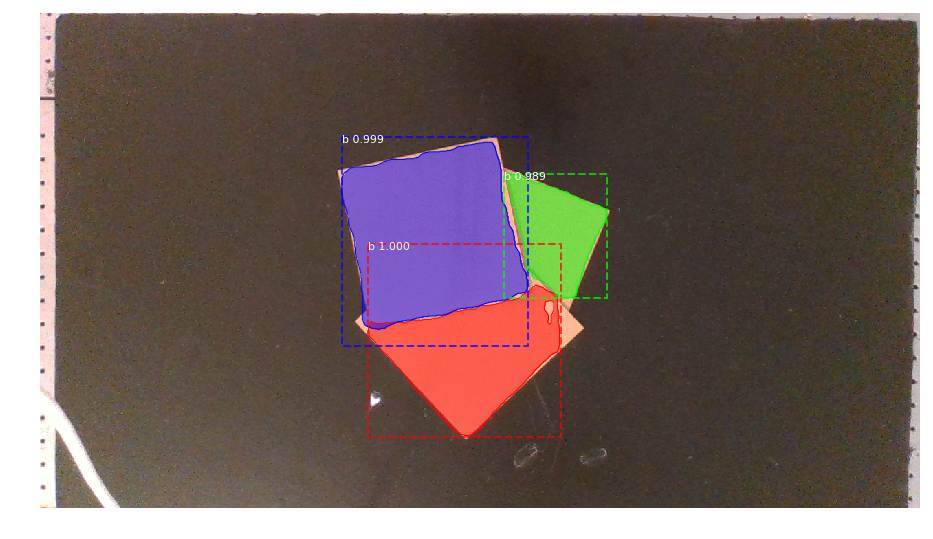

33011
53676
15333


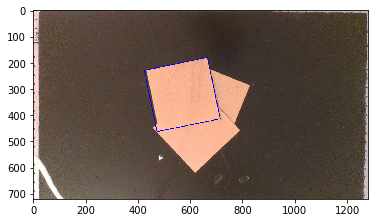

[[473 463]
 [425 230]
 [666 180]
 [715 414]]


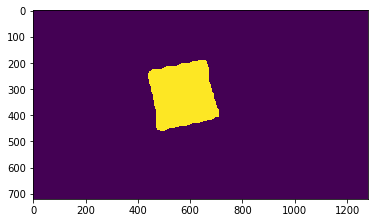

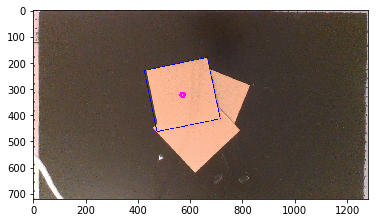

571 323
[241, 50]
11.720811498809491
output angle =  -11.720811498809491
center_x = 571 , center_y =  323
carton_pose_msg is  header: 
  seq: 44
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.0466371
Hong_y: -0.0250083
Kong_x: 0.0
Kong_y: 0.0
angle: -0.20456675165983704
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


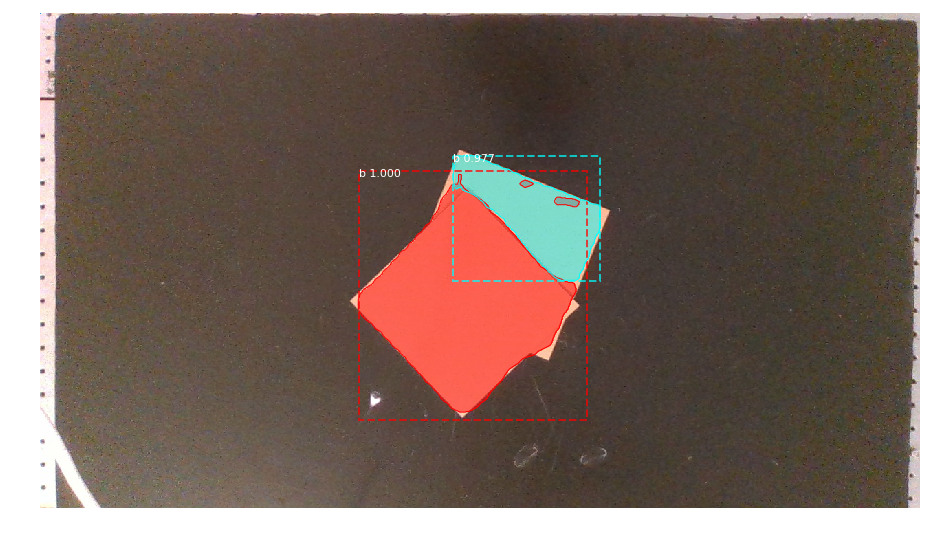

57775
18602


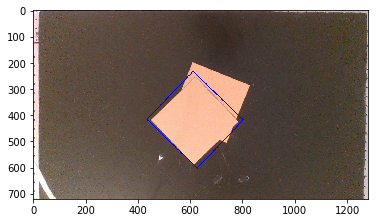

[[627 602]
 [435 416]
 [611 233]
 [803 418]]


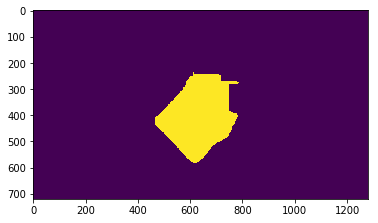

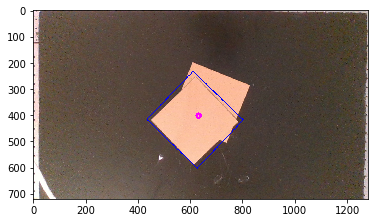

632 402
[176, 183]
46.11704635031857
output angle =  43.88295364968143
center_x = 632 , center_y =  402
carton_pose_msg is  header: 
  seq: 45
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.0054072
Hong_y: 0.028387799999999998
Kong_x: 0.0
Kong_y: 0.0
angle: 0.7659020266870032
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    8.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


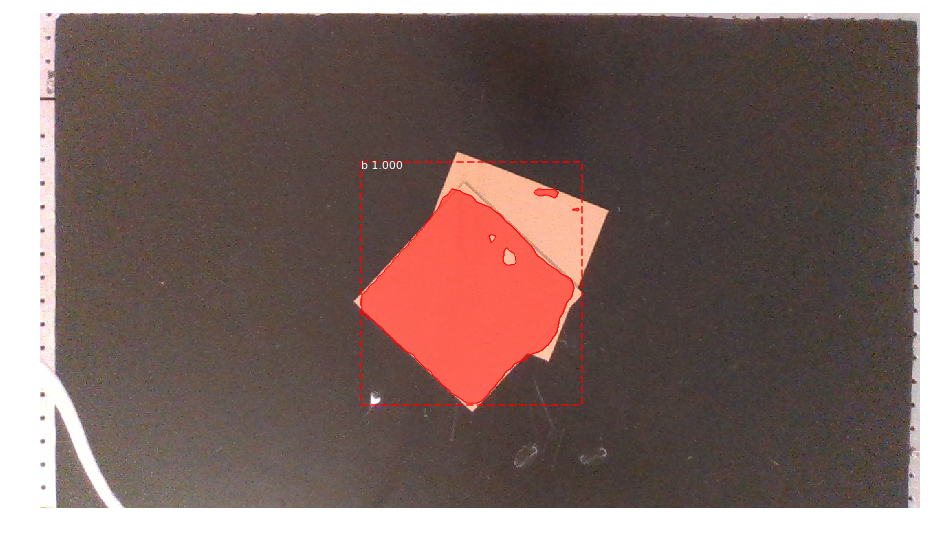

55185


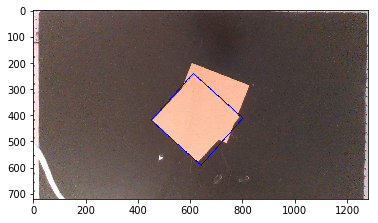

[[642 591]
 [451 420]
 [612 241]
 [802 411]]


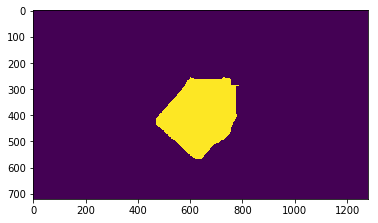

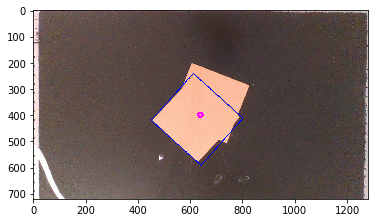

639 399
[161, 179]
48.030476845860605
output angle =  41.9695231541394
center_x = 639 , center_y =  399
carton_pose_msg is  header: 
  seq: 46
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.0006759
Hong_y: 0.0263601
Kong_x: 0.0
Kong_y: 0.0
angle: 0.7325063645317281


In [ ]:
# from camera calibration
# cx = 320.37#312.8339
# cy = 236.51#247.5236

cx = 658#643#1280
cy = 0#671#720

# hong_cx = 623
# hong_cy = 606

hong_cx = 1280 / 2
hong_cy = 720 / 2

while(True):
    
    if(is_detect == 1):
        pose_pub = rospy.Publisher('/carton_pose', carton_pose, queue_size=10)
        # Load a the image
        #image = scipy.misc.imread('IMG_0393.JPG')
        
        image = scipy.misc.imread('/home/qxuaj/Desktop/carton_erecting/image/'+ img_index +'.jpeg')
#         image = scipy.misc.imread('/home/qxuaj/Desktop/carton_perception/Mask_RCNN/datasets/board/val/qq0.jpeg')
        
        
        # Run detection
        results = model.detect([image], verbose=1)
        
        # Visualize results
        r = results[0]
        visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            class_names, r['scores'])
        
        #img = cv2.imread('IMG_0393.JPG',0)
        #img = cv2.imread('/home/qxuaj/Desktop/carton_erecting/imagee/'+ img_index +'.jpeg',0)
        #print(mask_rank(img, r['masks']))
        mask_max, box_max = mask_rank(image, r['masks'])

        #Erode and then dilate the image to eliminate the noise
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(100, 100))
        mask_dilated = cv2.dilate(mask_max, kernel)
        mask_max = cv2.erode(mask_dilated, kernel)

        plt.imshow(mask_max)
        plt.show()
        
        img_copy = image.copy()
        cv2.drawContours(img_copy,[box_max],0,(0,0,255),2)
        
#         center_point_x = int((box_max[0][0] + box_max[1][0] + box_max[2][0] + box_max[3][0])/4)
#         center_point_y = int((box_max[0][1] + box_max[1][1] + box_max[2][1] + box_max[3][1])/4)
        
        _, contours,hierarchy = cv2.findContours(mask_max,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
        cnt = contours[0]
        M = cv2.moments(cnt)
        center_point_x = int(M['m10']/M['m00'])
        center_point_y = int(M['m01']/M['m00'])
        
        
        cv2.circle(img_copy, (center_point_x, center_point_y), 8, (255, 0, 255), 8)
    
        plt.imshow(img_copy)
        plt.show()
        
        
        print(center_point_x, center_point_y)
        
        #calc angle
        v = [(box_max[1]-box_max[2])[0], (box_max[1]-box_max[2])[1]]
        if (v[0] < 0):
            v[0] = -v[0]
            v[1] = v[1]
        else:
            v[1] = -v[1]
        rotation = math.atan2(v[1], v[0])
        print(v)
        print(rotation / math.pi * 180)
        
        if (rotation / math.pi * 180 > 45) :
            angle = math.pi/2 - rotation
        elif ((rotation / math.pi * 180 <= 0) and (rotation / math.pi * 180 >= -45)):
            angle = -rotation
        elif (rotation / math.pi * 180 < -45):
            angle = -rotation - math.pi/2
        elif ((rotation / math.pi * 180 >= 0) and (rotation / math.pi * 180 <= 45)):
            angle = -rotation
        
        print('output angle = ', angle/math.pi*180)
        
        
        carton_pose_msg = carton_pose()
        
        print('center_x =', center_point_x, ', center_y = ', center_point_y)
        carton_pose_msg.Hong_x = (center_point_x - hong_cx) * 0.6759 * 0.001 # transfer pixel position to camera frame coordinates
        carton_pose_msg.Hong_y = (center_point_y - hong_cy) * 0.6759 * 0.001 #183 165 332
        
        carton_pose_msg.Kong_x = 0 * 0.6759 * 0.001 # transfer pixel position to camera frame coordinates
        carton_pose_msg.Kong_y = 0 * 0.6759 * 0.001 #183 165 332
        
        carton_pose_msg.angle = angle
        
        pose_pub.publish(carton_pose_msg)
        print('carton_pose_msg is ', carton_pose_msg)
        
        
        is_detect = 0

In [22]:
is_detect = 0